**>>>  work derived mainly from Paul Mooney: **** 

(trying to learn something, and enjoy it)


# **Collections of Paintings from 50 Influential Artists**
* Part 1: Exploratory Data Analysis
* Part 2: Image Classification using Fastai

*Part 1: Exploratory Data Analysis*

In [131]:
import numpy as np
import pandas as pd 
import cv2
from fastai.vision import *
from wordcloud import WordCloud, STOPWORDS
from collections import Counter
from nltk.corpus import stopwords
import matplotlib.pyplot as plt
import seaborn as sns
import os
import shutil
from glob import glob
%matplotlib inline
!pip freeze > '../working/dockerimage_snapshot.txt'    # Output installed packages in requirements format.

In [2]:
ls -l ../working/*

---------- 1 root root  263 Apr 10 23:06 ../working/__notebook_source__.ipynb
-rw-r--r-- 1 root root 9665 Apr 10 23:08 ../working/dockerimage_snapshot.txt


In [37]:
cat dockerimage_snapshot.txt | head

absl-py==0.7.0
alabaster==0.7.10
algopy==0.5.7
altair==2.4.1
anaconda-client==1.6.14
anaconda-navigator==1.8.7
anaconda-project==0.8.2
annoy==1.15.1
appdirs==1.4.3
arrow==0.13.1


In [132]:
def makeWordCloud(df,column,numWords):
    topic_words = [ z.lower() for y in
                       [ x.split() for x in df[column] if isinstance(x, str)]
                       for z in y]
    word_count_dict = dict(Counter(topic_words))
    popular_words = sorted(word_count_dict, key = word_count_dict.get, reverse = True)
    popular_words_nonstop = [w for w in popular_words if w not in stopwords.words("english")]
    word_string=str(popular_words_nonstop)
    wordcloud = WordCloud(stopwords=STOPWORDS,
                          background_color='white',
                          max_words=numWords,
                          width=1000,height=1000,
                         ).generate(word_string)
    plt.clf()
    plt.imshow(wordcloud)
    plt.axis('off')
    plt.show()

def plotImages(artist,directory):
    print(artist)
    multipleImages = glob(directory)
    plt.rcParams['figure.figsize'] = (15, 15)
    plt.subplots_adjust(wspace=0, hspace=0)
    i_ = 0
    for l in multipleImages[:25]:               # do 25 images
        im = cv2.imread(l)
        im = cv2.resize(im, (128, 128)) 
        plt.subplot(5, 5, i_+1) #.set_title(l)
        plt.imshow(cv2.cvtColor(im, cv2.COLOR_BGR2RGB)); plt.axis('off')
        i_ += 1

np.random.seed(7)
overview = pd.read_csv('../input/artists.csv')
overviewArtist = overview[['name','paintings']]
overviewArtist = overviewArtist.sort_values(by=['paintings'],ascending=False)
overviewArtist = overviewArtist.reset_index()
overviewArtist = overviewArtist[['name','paintings']]

In [10]:
overview.shape

(50, 8)

In [11]:
pd.get_option("display.max_rows")

60

In [12]:
pd.set_option("display.max_rows", 999)

In [16]:
pd.get_option("display.max_columns")

0

In [17]:
overview

,id,name,years,genre,nationality,bio,wikipedia,paintings
0,0,Amedeo Modigliani,1884 - 1920,Expressionism,Italian,Amedeo Clemente Modigliani (Italian pronunciat...,http://en.wikipedia.org/wiki/Amedeo_Modigliani,193
1,1,Vasiliy Kandinskiy,1866 - 1944,"Expressionism,Abstractionism",Russian,Wassily Wassilyevich Kandinsky (Russian: Васи́...,http://en.wikipedia.org/wiki/Wassily_Kandinsky,88
2,2,Diego Rivera,1886 - 1957,"Social Realism,Muralism",Mexican,Diego María de la Concepción Juan Nepomuceno E...,http://en.wikipedia.org/wiki/Diego_Rivera,70
3,3,Claude Monet,1840 - 1926,Impressionism,French,Oscar-Claude Monet (; French: [klod mɔnɛ]; 14 ...,http://en.wikipedia.org/wiki/Claude_Monet,73
4,4,Rene Magritte,1898 - 1967,"Surrealism,Impressionism",Belgian,René François Ghislain Magritte (French: [ʁəne...,http://en.wikipedia.org/wiki/René_Magritte,194
5,5,Salvador Dali,1904 - 1989,Surrealism,Spanish,Salvador Domingo Felipe Jacinto Dalí i Domènec...,http://en.wikipedia.org/wiki/Salvador_Dalí,139
6,6,Edouard Manet,1832 - 1883,"Realism,Impressionism",French,Édouard Manet (US: ; UK: ; French: [edwaʁ manɛ...,http://en.wikipedia.org/wiki/Édouard_Manet,90
7,7,Andrei Rublev,1360 - 1430,Byzantine Art,Russian,"Andrei Rublev (Russian: Андре́й Рублёв, IPA: [...",http://en.wikipedia.org/wiki/Andrei_Rublev,99
8,8,Vincent van Gogh,1853 – 1890,Post-Impressionism,Dutch,Vincent Willem van Gogh (Dutch: [ˈvɪnsɛnt ˈʋɪl...,http://en.wikipedia.org/wiki/Vincent_van_Gogh,877
9,9,Gustav Klimt,1862 - 1918,"Symbolism,Art Nouveau",Austrian,"Gustav Klimt (July 14, 1862 – February 6, 1918...",http://en.wikipedia.org/wiki/Gustav_Klimt,117


In [21]:
ls

__notebook_source__.ipynb  dockerimage_snapshot.txt


In [20]:
ls -a   # show hidden

./   .ipynb_checkpoints/        dockerimage_snapshot.txt
../  __notebook_source__.ipynb


In [18]:
os.listdir()   # show current

['__notebook_source__.ipynb', '.ipynb_checkpoints', 'dockerimage_snapshot.txt']

In [22]:
os.listdir("../input/images/images/")

['William_Turner',
 'El_Greco',
 'Alfred_Sisley',
 'Pablo_Picasso',
 'Diego_Velazquez',
 'Amedeo_Modigliani',
 'Gustav_Klimt',
 'Piet_Mondrian',
 'Jan_van_Eyck',
 'Albrecht_Du╠êrer',
 'Vasiliy_Kandinskiy',
 'Michelangelo',
 'Mikhail_Vrubel',
 'Henri_Matisse',
 'Edvard_Munch',
 'Andrei_Rublev',
 'Leonardo_da_Vinci',
 'Peter_Paul_Rubens',
 'Claude_Monet',
 'Sandro_Botticelli',
 'Paul_Klee',
 'Camille_Pissarro',
 'Francisco_Goya',
 'Henri_Rousseau',
 'Jackson_Pollock',
 'Frida_Kahlo',
 'Salvador_Dali',
 'Gustave_Courbet',
 'Raphael',
 'Pierre-Auguste_Renoir',
 'Edouard_Manet',
 'Diego_Rivera',
 'Rembrandt',
 'Kazimir_Malevich',
 'Giotto_di_Bondone',
 'Hieronymus_Bosch',
 'Albrecht_Dürer',
 'Joan_Miro',
 'Rene_Magritte',
 'Andy_Warhol',
 'Pieter_Bruegel',
 'Georges_Seurat',
 'Titian',
 'Henri_de_Toulouse-Lautrec',
 'Edgar_Degas',
 'Paul_Cezanne',
 'Eugene_Delacroix',
 'Paul_Gauguin',
 'Caravaggio',
 'Marc_Chagall',
 'Vincent_van_Gogh']

In [23]:
print(os.listdir("../input/images/images/"))

['William_Turner', 'El_Greco', 'Alfred_Sisley', 'Pablo_Picasso', 'Diego_Velazquez', 'Amedeo_Modigliani', 'Gustav_Klimt', 'Piet_Mondrian', 'Jan_van_Eyck', 'Albrecht_Du╠êrer', 'Vasiliy_Kandinskiy', 'Michelangelo', 'Mikhail_Vrubel', 'Henri_Matisse', 'Edvard_Munch', 'Andrei_Rublev', 'Leonardo_da_Vinci', 'Peter_Paul_Rubens', 'Claude_Monet', 'Sandro_Botticelli', 'Paul_Klee', 'Camille_Pissarro', 'Francisco_Goya', 'Henri_Rousseau', 'Jackson_Pollock', 'Frida_Kahlo', 'Salvador_Dali', 'Gustave_Courbet', 'Raphael', 'Pierre-Auguste_Renoir', 'Edouard_Manet', 'Diego_Rivera', 'Rembrandt', 'Kazimir_Malevich', 'Giotto_di_Bondone', 'Hieronymus_Bosch', 'Albrecht_Dürer', 'Joan_Miro', 'Rene_Magritte', 'Andy_Warhol', 'Pieter_Bruegel', 'Georges_Seurat', 'Titian', 'Henri_de_Toulouse-Lautrec', 'Edgar_Degas', 'Paul_Cezanne', 'Eugene_Delacroix', 'Paul_Gauguin', 'Caravaggio', 'Marc_Chagall', 'Vincent_van_Gogh']


In [33]:
ls ../input/images/images/Henri_Rousseau | head

Henri_Rousseau_1.jpg
Henri_Rousseau_10.jpg
Henri_Rousseau_11.jpg
Henri_Rousseau_12.jpg
Henri_Rousseau_13.jpg
Henri_Rousseau_14.jpg
Henri_Rousseau_15.jpg
Henri_Rousseau_16.jpg
Henri_Rousseau_17.jpg
Henri_Rousseau_18.jpg


(-0.5, 749.5, 540.5, -0.5)

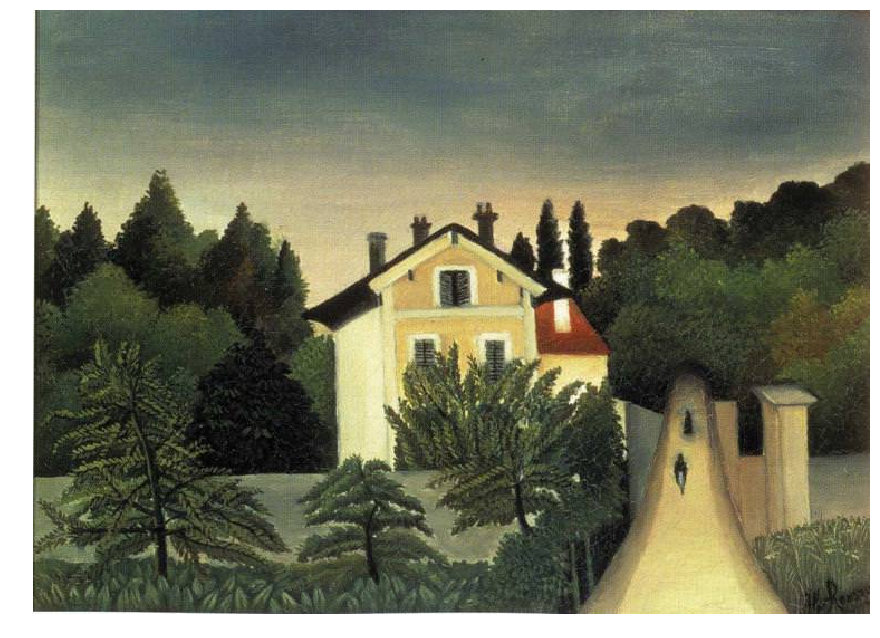

In [135]:
plt.rcParams['figure.figsize'] = (15, 15)
#plt.imshow(cv2.imread("../input/images/images/Henri_Rousseau/Henri_Rousseau_60.jpg"))
im = cv2.imread("../input/images/images/Henri_Rousseau/Henri_Rousseau_18.jpg")
plt.imshow(cv2.cvtColor(im, cv2.COLOR_BGR2RGB)); plt.axis('off')

In [ ]:
plotImages("Vincent van Gogh","../input/images/images/Vincent_van_Gogh/**")      # do 25 images

In [ ]:
!ls ../input/images/images/Vincent_van_Gogh/** > x.txt
lines_in_file = open('x.txt', 'r').readlines()
number_of_lines = len(lines_in_file)
print ("number of van gogh paintings:", number_of_lines)

In [ ]:
plotImages("Leonardo da Vinci","../input/images/images/Leonardo_da_Vinci/**")      

In [ ]:
!ls ../input/images/images/Leonardo_da_Vinci/** > x.txt
lines_in_file = open('x.txt', 'r').readlines()
number_of_lines = len(lines_in_file)
print ("number of van gogh paintings:", number_of_lines)

In [ ]:
plotImages("Andy Warhol","../input/images/images/Andy_Warhol/**")      

In [ ]:
plotImages("Pablo Picasso","../input/images/images/Pablo_Picasso/**")      

In [ ]:
plotImages("Salvador Dali","../input/images/images/Salvador_Dali/**")

In [ ]:
plotImages("Jackson Pollock","../input/images/images/Jackson_Pollock/**")

In [ ]:
plotImages("Raphael","../input/images/images/Raphael/**")      

Rembrandt


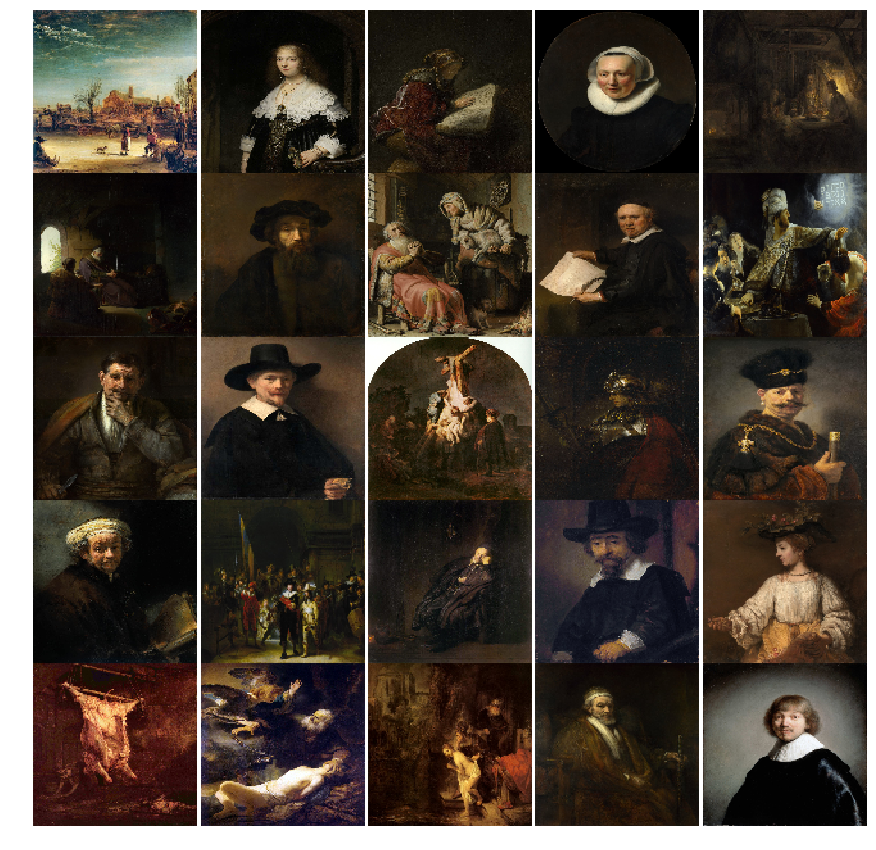

In [69]:
plotImages("Rembrandt","../input/images/images/Rembrandt/**")      

In [95]:
ls ../input/images/images/Henri_Rousseau/** | head

../input/images/images/Henri_Rousseau/Henri_Rousseau_1.jpg
../input/images/images/Henri_Rousseau/Henri_Rousseau_10.jpg
../input/images/images/Henri_Rousseau/Henri_Rousseau_11.jpg
../input/images/images/Henri_Rousseau/Henri_Rousseau_12.jpg
../input/images/images/Henri_Rousseau/Henri_Rousseau_13.jpg
../input/images/images/Henri_Rousseau/Henri_Rousseau_14.jpg
../input/images/images/Henri_Rousseau/Henri_Rousseau_15.jpg
../input/images/images/Henri_Rousseau/Henri_Rousseau_16.jpg
../input/images/images/Henri_Rousseau/Henri_Rousseau_17.jpg
../input/images/images/Henri_Rousseau/Henri_Rousseau_18.jpg


In [127]:
def plotImages2(artist,directory):    # this is my version for more images
    print(artist)
    multipleImages = glob(directory)
    plt.rcParams['figure.figsize'] = (20, 80)
    plt.rcParams['savefig.dpi'] = 60
    plt.subplots_adjust(left=0.1, right=0.9,  bottom=0.1, top=0.9, wspace=0.1, hspace=0.2)
    ax=plt.subplots
    i_ = 0
    for l in multipleImages[:100]:               # do 100 images
        im = cv2.imread(l)
        im = cv2.resize(im, (128, 128)) 
        ax = plt.subplot(20, 5, i_+1) 
        m = l[-6:-4]     # get the number of the painting from the name of file
        ax.set_title(m, fontsize=20)
        plt.imshow(cv2.cvtColor(im, cv2.COLOR_BGR2RGB)); plt.axis('off')
        i_ += 1
        


Henri Rousseau


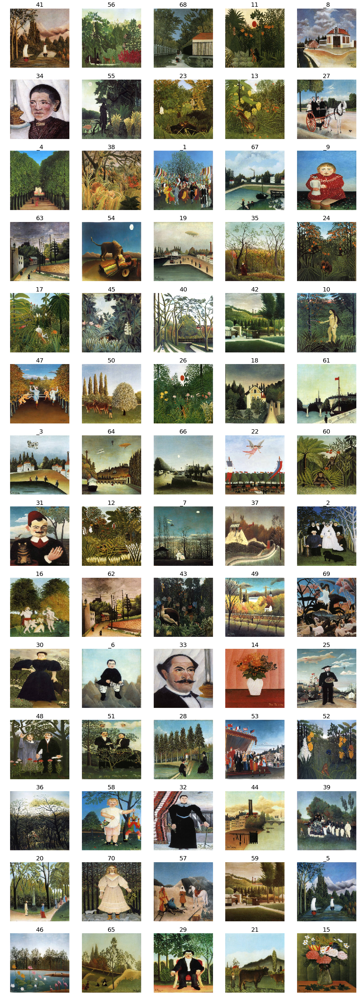

In [128]:
plotImages2("Henri Rousseau","../input/images/images/Henri_Rousseau/**")  

In [ ]:
plt.figure(figsize=(10,10))
makeWordCloud(overview,'bio',10000000)

In [ ]:
plt.figure(figsize=(5,5))
nationalityPlot = sns.countplot(y='nationality',data=overview)
nationalityPlot

In [ ]:
overviewArtist.head(25)

*Part 2: Image Classification using Fastai*

In [ ]:
img_dir='../input/images'
path=Path(img_dir)
data = ImageDataBunch.from_folder(path, train=".", 
                                  valid_pct=0.2,
                                  ds_tfms=get_transforms(do_flip=False,flip_vert=False, max_rotate=0,max_lighting=0.3),
                                  size=299,bs=64, 
                                  num_workers=0).normalize(imagenet_stats)
print(f'Classes: \n {data.classes}')
data.show_batch(rows=8, figsize=(40,40))

In [ ]:
# >>>  was resnet50, I changed to 18
learn = create_cnn(data, models.resnet18, metrics=accuracy,model_dir=Path("/kaggle/working/"),path=Path("."))
learn.fit_one_cycle(3)

In [ ]:
learn.save('art_model1')   # my addition

In [ ]:
learn.load('art_model1')   # my addition

In [ ]:
plt.rcParams['figure.figsize'] = (5, 5)
learn.unfreeze()
learn.lr_find()
learn.recorder.plot()

In [ ]:
learn.fit_one_cycle(30 , slice(1e-6, 1e-5))	# <<< next learning
#  originaly:  learn.fit_one_cycle(10)

In [ ]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix(figsize=(15,15), dpi=60)

In [ ]:
interp.most_confused(min_val=2)         #  my add:  show most confused

In [ ]:
learn.show_results(3, figsize= (15,15))     # <<< see some predictions

In [ ]:
#class_score , y = learn.get_preds(DatasetType.Test)   # made some predications
#class_score = np.argmax(class_score, axis=1)          # take only the top predication as result
#class_score[1].item()

In [ ]:
interp.plot_top_losses(6, figsize=(15, 10))    # my addition:  top losses

In [ ]:
losses,idxs = interp.top_losses()       # my add
len(data.valid_ds)==len(losses)==len(idxs)
interp.plot_top_losses(9, figsize=(15,11))		# show top losses
doc(interp.plot_top_losses)


(-0.5, 576.5, 749.5, -0.5)

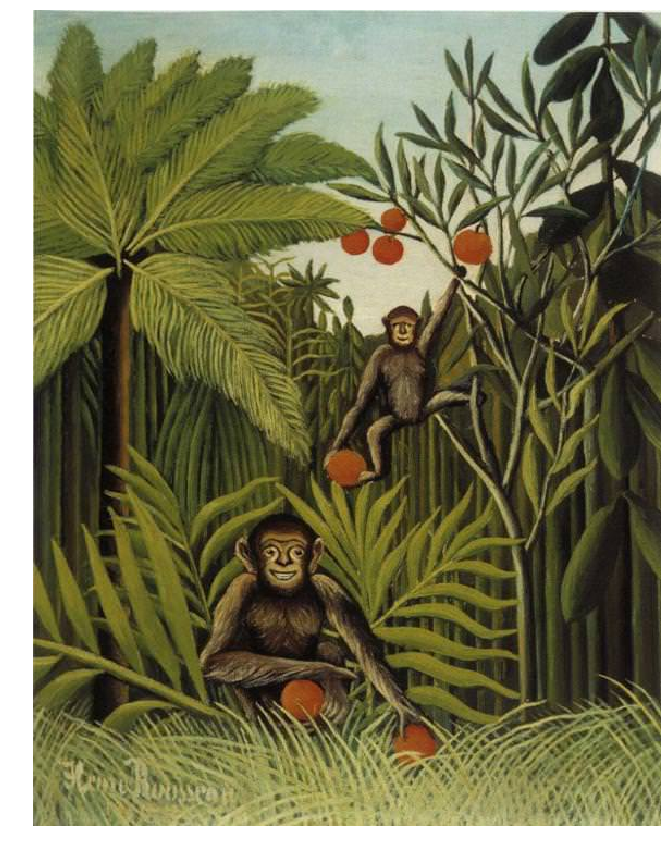

In [133]:
plt.rcParams['figure.figsize'] = (15, 15)
#plt.imshow(cv2.imread("../input/images/images/Henri_Rousseau/Henri_Rousseau_60.jpg"))
im = cv2.imread("../input/images/images/Henri_Rousseau/Henri_Rousseau_60.jpg")
plt.imshow(cv2.cvtColor(im, cv2.COLOR_BGR2RGB)); plt.axis('off')

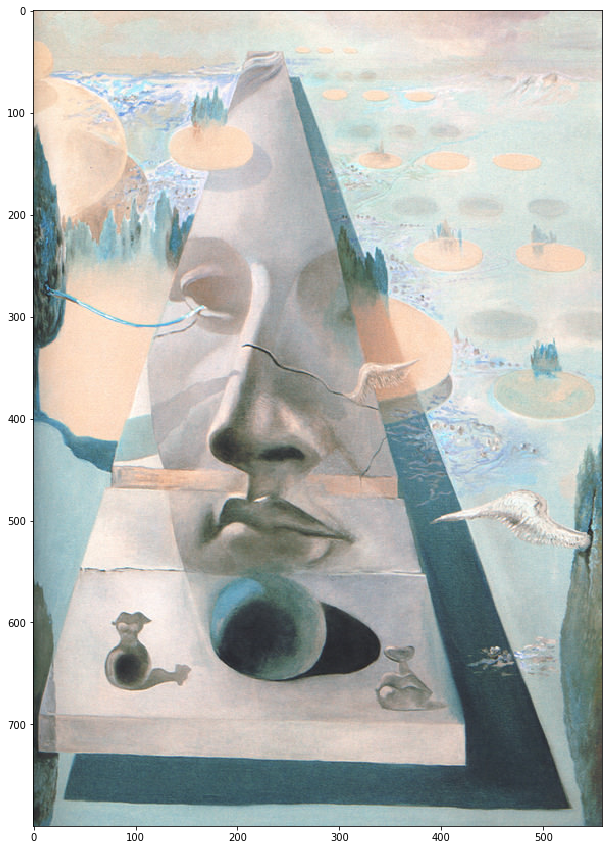

In [130]:
plt.rcParams['figure.figsize'] = (15, 15)
#  think this is wrong! see below
plt.imshow(cv2.imread("../input/images/images/Salvador_Dali/Salvador_Dali_86.jpg"))

(-0.5, 557.5, 799.5, -0.5)

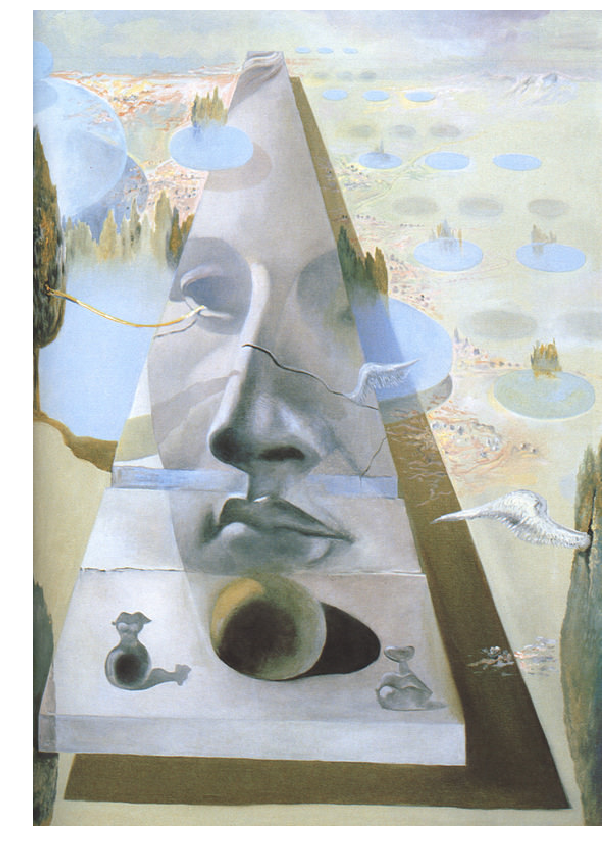

In [134]:
plt.rcParams['figure.figsize'] = (15, 15)
#plt.imshow(cv2.imread("../input/images/images/Henri_Rousseau/Henri_Rousseau_60.jpg"))
im = cv2.imread("../input/images/images/Salvador_Dali/Salvador_Dali_86.jpg")
plt.imshow(cv2.cvtColor(im, cv2.COLOR_BGR2RGB)); plt.axis('off')